# Прочерчивание максимумов Х-структуры -- построение рисунков

In [1]:
%pylab
%matplotlib inline

Using matplotlib backend: <object object at 0x7f45c45049c0>
%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [2]:
import matplotlib.pyplot as plt
from astropy.visualization import astropy_mpl_style
from astropy.io import fits
import os
import shutil
import pandas as pd
import sys
import numpy as np
import matplotlib as mpl
import matplotlib.lines as mlines
import warnings
from astropy.visualization import astropy_mpl_style
import copy
from matplotlib.colors import LogNorm
from matplotlib.colors import SymLogNorm
from libs.mathFunctions import explaw
from libs.mathFunctions import fit_by_explaw

In [54]:
# Формат: 
#names = [[name_gal,name_gal_ell,onr,ond,onm,cut_x,cut_y,b_ang,onbd_a,onbd_d,onbd_m,ell,vmin,vmax,
#                                                              figsize1x,figsize1y,figsize2x,figsize2y], ... ],
#    где name_gal -- имя галактики, name_gal_ell -- имя галактики с указанием эллиптичности эллипсов,
#    ona,ond,onm (первые две буквы -- old/new) -- 'old' или 'new', т.е. плохие пики учтены ('new') или нет ('old'),
#    cut_x -- пиксельное расст-е от центра до края по х-оси, 
#    cut_y -- по y-оси (эти cut используются при построении чёрной прямой х-структуры),
#    b_ang -- угол для чёрной прямой х-структуры 
#    onbd_a,onbd_d,onbd_m -- рисовать чёрные точки (прямая х-структура) ('y') или нет ('n'),
#    vmin,vmax -- аргументы plt.imshow
#    ell -- эллиптичность,
#    figsize1{x/y} -- размеры "холста" для первой картинки (picture_peaks_{name_gal_ell}.png)
#    figsize2{x/y} -- размеры "холста" для второй картинки (graphs_{name_gal_ell}.png)
# ------------------------------------------------------------------------------------------ 
# ['h_1237','h_1237_0_4','old','old','old',80,30,0.61,'y','y','y',0.4,0.005,5,22,12,27,36]
# ['h_1237','h_1237_0_7','old','old','old',80,30,0.61,'n','n','y',0.7,0.005,5,22,12,27,36]
# ['h_eon150','h_eon150_0_4','old','old','old',80,30,0.41,'y','y','y',0.4,0.005,5,22,12,27,36]
# ['h_eon150','h_eon150_0_7','old','old','old',80,30,0.41,'n','n','y',0.7,0.005,5,22,12,27,36]
# ['ib_732','ib_732_0_4','old','old','old',80,30,0.60,'y','y','y',0.4,0.005,5,22,12,27,36]
# ['ib_732','ib_732_0_7','old','old','old',80,30,0.60,'n','n','y',0.7,0.005,5,22,12,27,36]
# ['ib_1720','ib_1720_0_4','old','old','old',80,40,0.50,'y','y','y',0.4,0.005,5,22,12,27,36]
# ['ib_1720','ib_1720_0_7','old','old','old',80,40,0.50,'n','y','y',0.7,0.005,5,22,12,27,36]
# ['ib_2015','ib_2015_0_3','old','old','old',40,20,0.65,'y','y','y',0.3,0.005,5,22,12,27,36]
# ['ib_2015','ib_2015_0_7','old','old','old',40,20,0.65,'n','n','y',0.7,0.005,5,22,12,27,36]
# ['mb_804','mb_804_0_4','old','old','old',30,14,0.60,'y','y','n',0.4,0.005,5,22,12,27,36]
# ['mb_804','mb_804_0_7','old','old','old',30,14,0.60,'n','n','n',0.7,0.005,5,22,12,27,36]
# ['mb_1354','mb_1354_0_3','old','old','old',40,25,0.55,'y','y','y',0.3,0.005,5,22,12,27,36]
# ['mb_1354','mb_1354_0_7','old','old','old',40,25,0.55,'y','y','y',0.7,0.005,5,22,12,27,36]
# ['mb_1640','mb_1640_0_3','old','old','old',30,20,0.50,'n','y','y',0.3,0.005,5,22,12,27,36]
# ['mb_1640','mb_1640_0_7','old','old','old',30,20,0.50,'n','n','y',0.7,0.005,5,22,12,27,36]
# ['mb_eon183','mb_eon183_0_4','old','old','old',100,60,0.65,'y','y','y',0.4,0.005,5,22,12,27,36]
# ['mb_eon183','mb_eon183_0_7','old','old','old',100,60,0.65,'n','y','y',0.7,0.005,5,22,12,27,36]

# ------------------------------------------------------------------------------------------ 
names = [['h_1237','h_1237_0_4','old','old','old',80,30,0.61,'y','y','y',0.4,0.005,5,22,12,27,36],
         ['h_eon150','h_eon150_0_4','old','old','old',80,30,0.41,'y','y','y',0.4,0.005,5,22,12,27,36],
         ['ib_732','ib_732_0_4','old','old','old',80,30,0.60,'y','y','y',0.4,0.005,5,22,12,27,36],
         ['ib_1720','ib_1720_0_4','old','old','old',80,40,0.50,'y','y','y',0.4,0.005,5,22,12,27,36],
         ['ib_2015','ib_2015_0_3','old','old','old',40,20,0.65,'y','y','y',0.3,0.005,5,22,12,27,36],
         ['mb_804','mb_804_0_4','old','old','old',30,14,0.60,'y','y','n',0.4,0.005,5,22,12,27,36],
         ['mb_1354','mb_1354_0_3','old','old','old',40,25,0.55,'y','y','y',0.3,0.005,5,22,12,27,36],
         ['mb_1640','mb_1640_0_3','old','old','old',30,20,0.50,'n','y','y',0.3,0.005,5,22,12,27,36],
         ['mb_eon183','mb_eon183_0_7','old','old','old',100,60,0.65,'n','y','y',0.7,0.005,5,22,12,27,36]]

titles_1 = ['Raw image', 'Image minus model disc', 'Image minus the whole model',
            'Raw image, PEAKS_HAND','Image minus model disc, PEAKS_HAND','Image minus the whole model, PEAKS_HAND',
            'Raw image, PEAKS','Image minus model disc, PEAKS','Image minus the whole model, PEAKS',
            'Raw image, PEAKS','Image minus model disc, PEAKS','Image minus the whole model, PEAKS']
titles_2 = ['ANGLES_HAND, Raw image, For hand results',
            'ANGLES_HAND, Image minus model disc, For hand results',
            'ANGLES_HAND, Image minus the whole model, For hand results',
            'ANGLES, Raw image, For script results',
            'ANGLES, Image minus model disc, For script results',
            'ANGLES, Image minus the whole model, For script results',
            'INTENSITY_HAND, Raw image, For hand results',
            'INTENSITY_HAND, Image minus model disc, For hand results',
            'INTENSITY_HAND, Image minus the whole model, For hand results',
            'INTENSITY, Raw image, For script results',
            'INTENSITY, Image minus model disc, For script results',
            'INTENSITY, Image minus the whole model, For script results',
            'INTENSITY, Raw image, For black "straight" (ideal case)',
            'INTENSITY, Image minus model disc, For black "straight" (ideal case)',
            'INTENSITY, Image minus the whole model, For black "straight" (ideal case)']

In [55]:
def rotate_via_numpy(x, y, radians):
    """Use numpy to build a rotation matrix and take the dot product."""
    c, s = np.cos(radians), np.sin(radians)
    j = np.matrix([[c, s], [-s, c]])
    m = np.dot(j, [x, y])
    return np.array(m.T[:,0]), np.array(m.T[:,1])

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
h_1237 , ellipticity = 0.400000


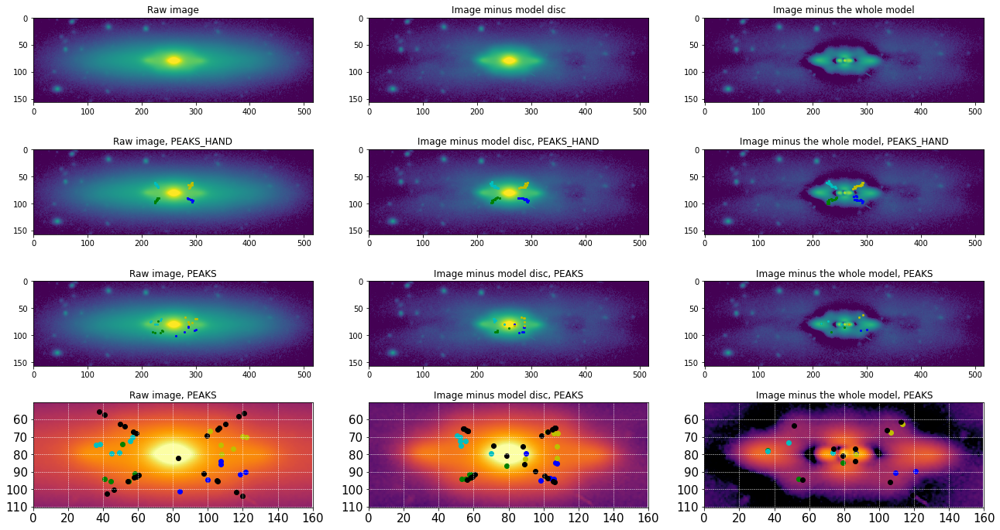

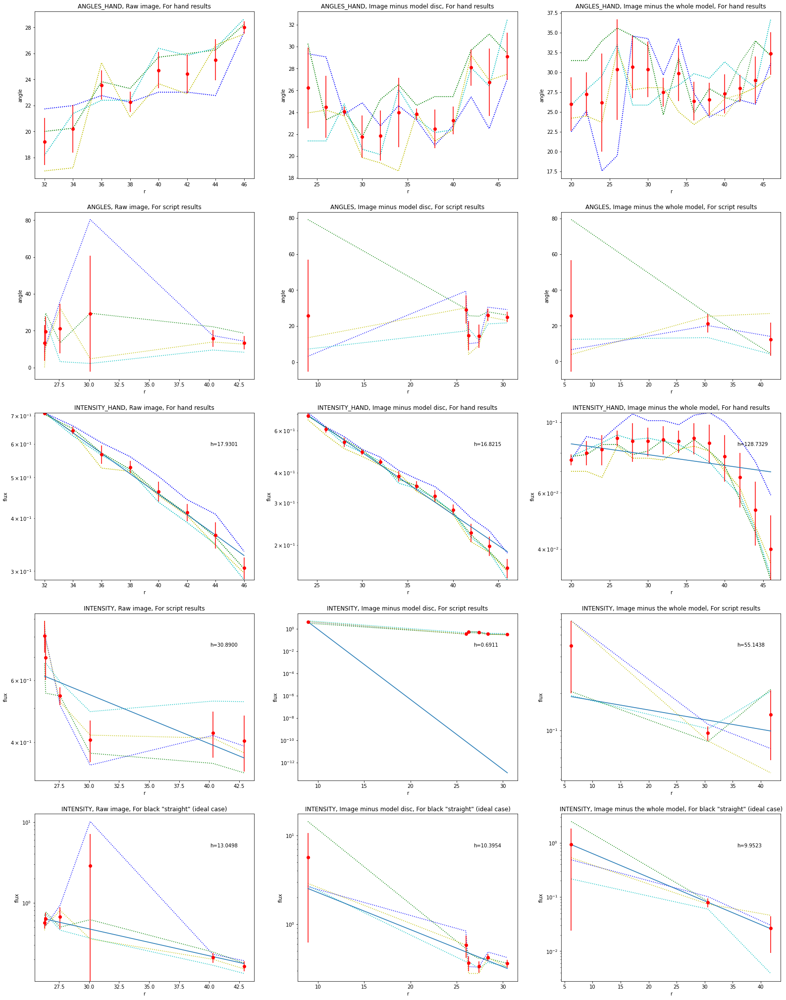

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
h_eon150 , ellipticity = 0.400000


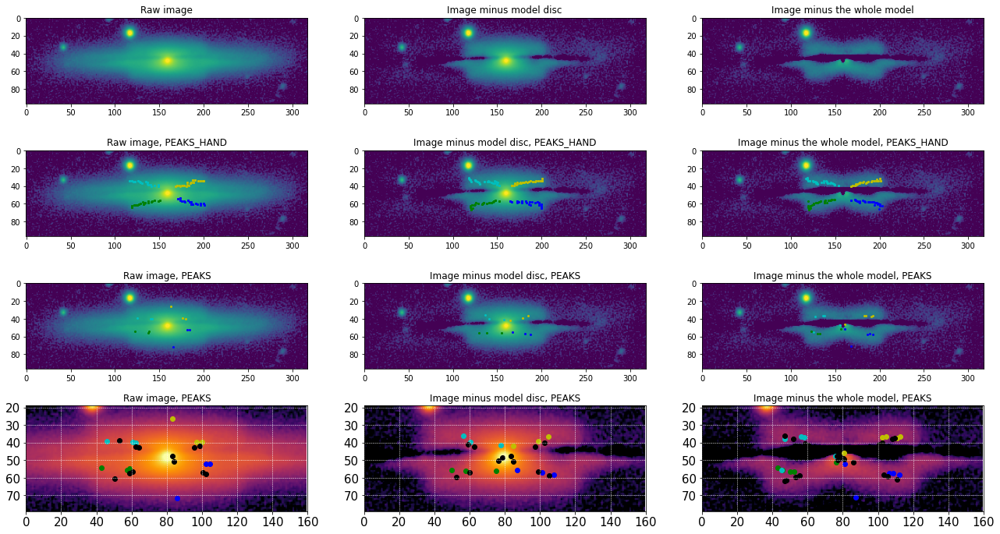

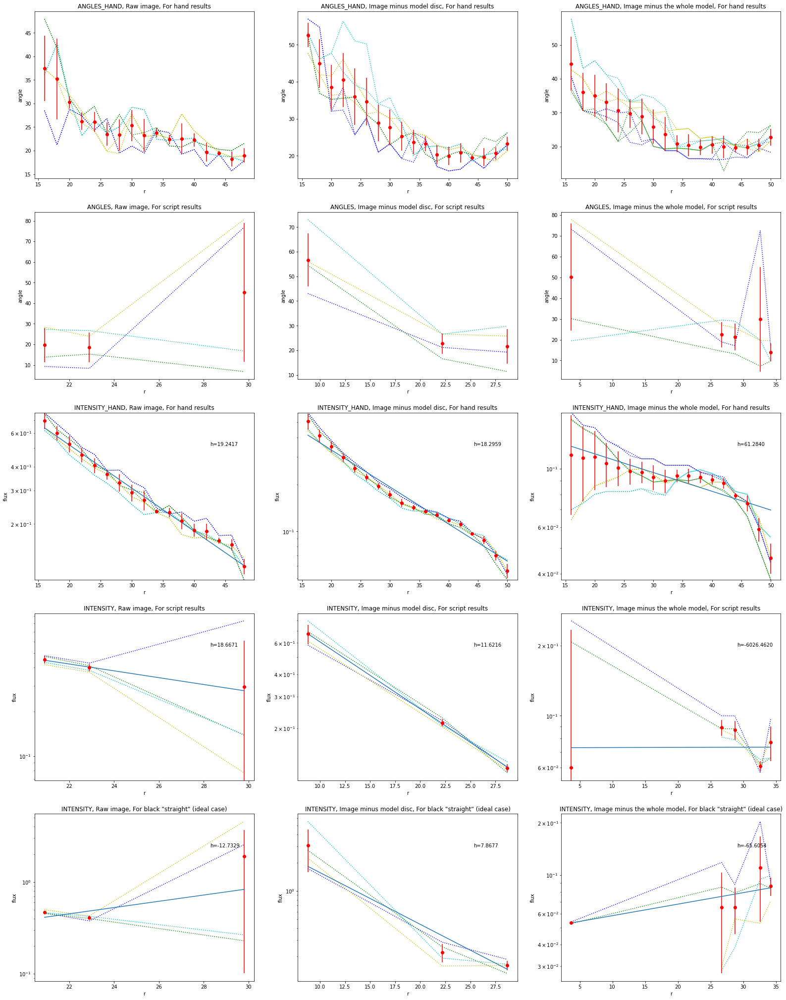

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
ib_732 , ellipticity = 0.400000


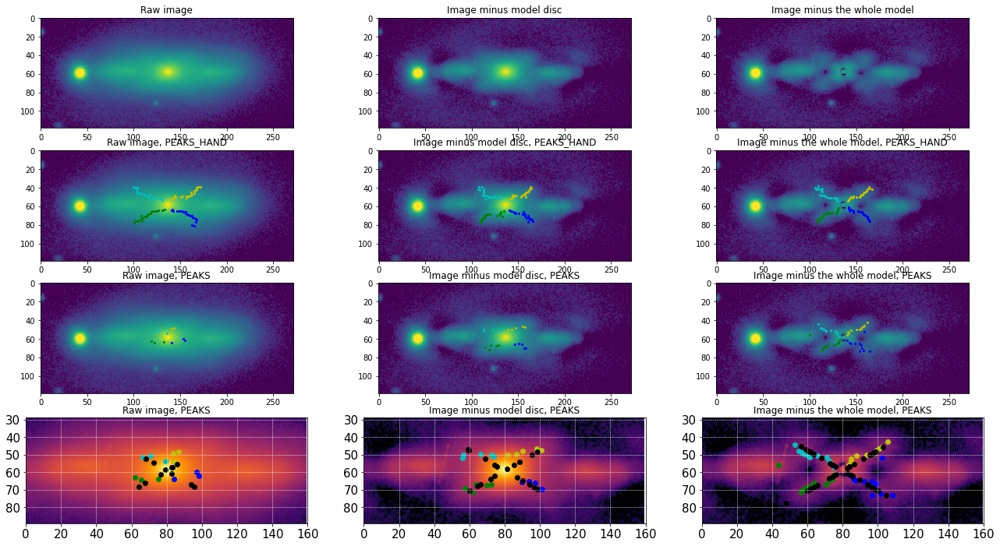

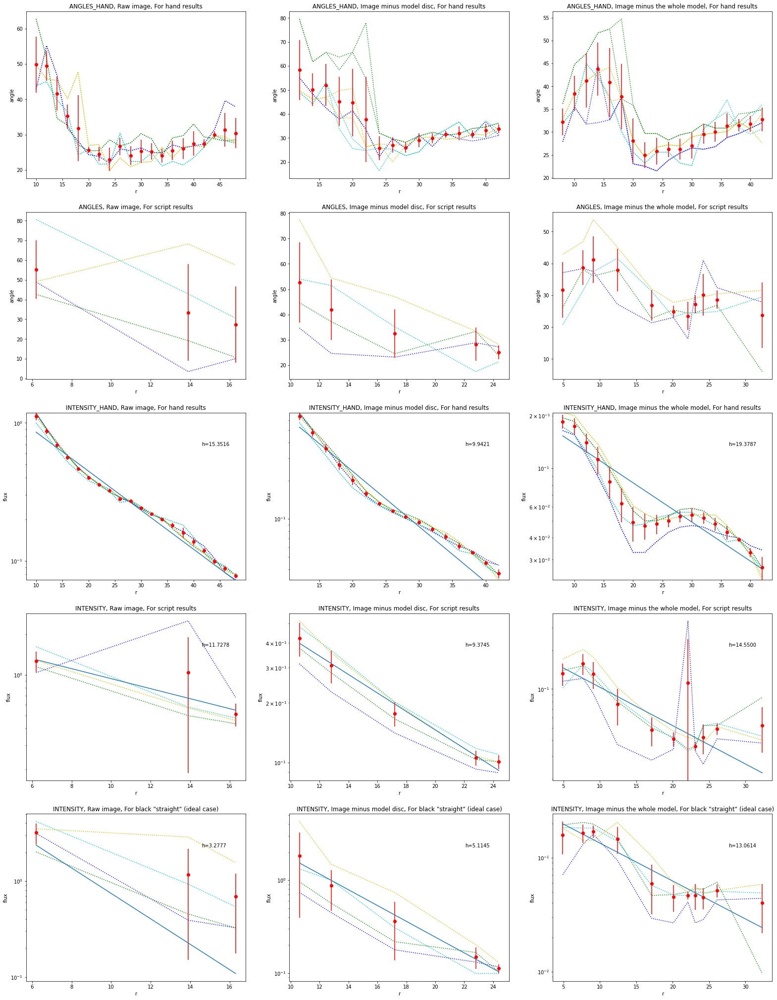

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
ib_1720 , ellipticity = 0.400000


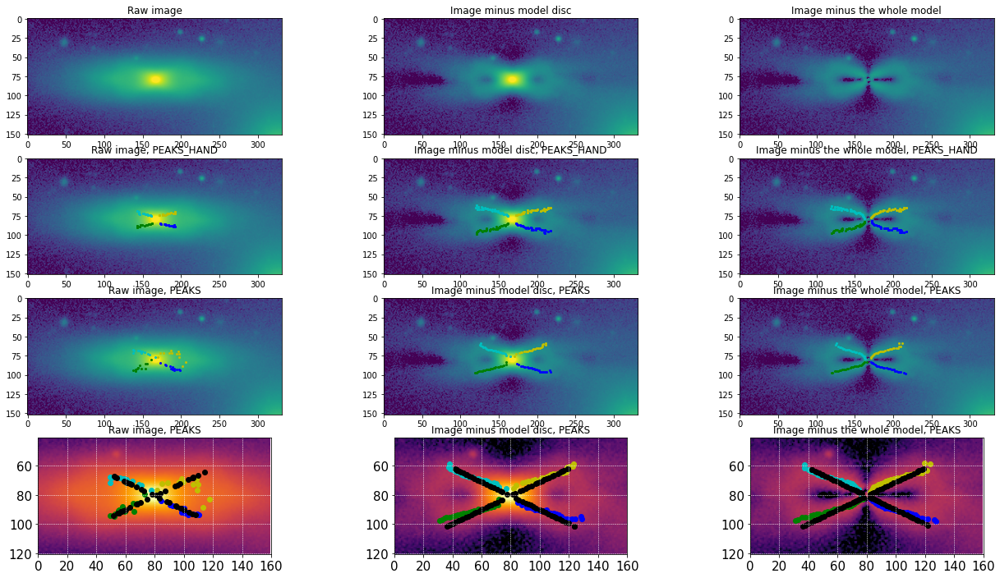

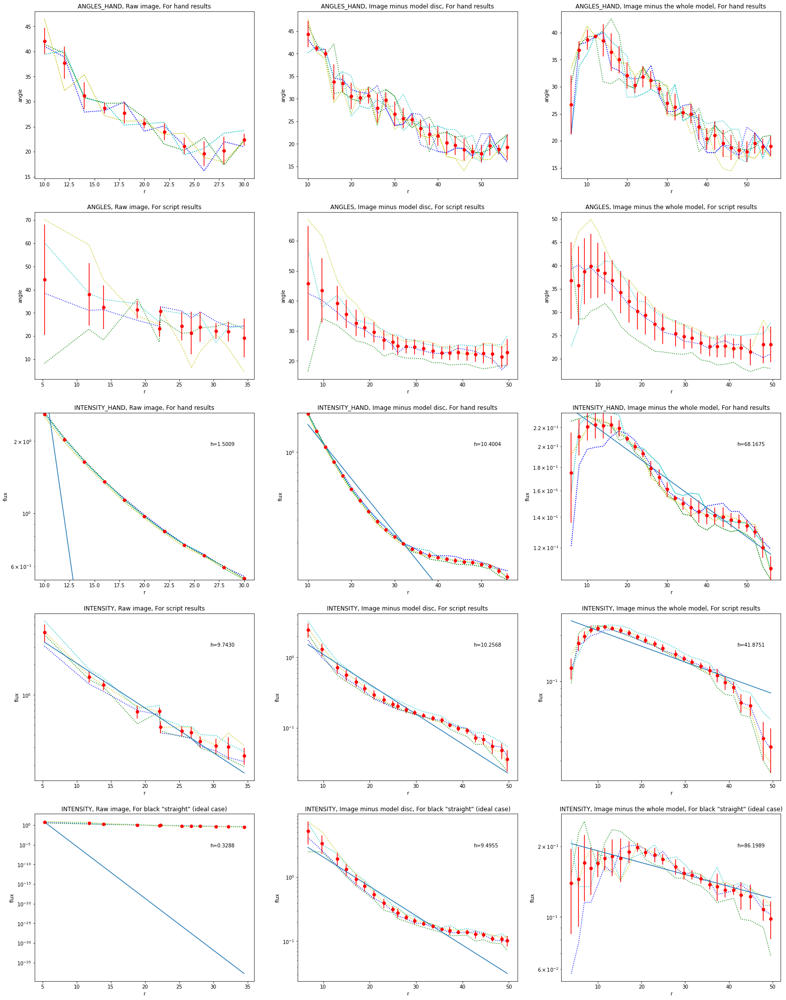

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
ib_2015 , ellipticity = 0.300000


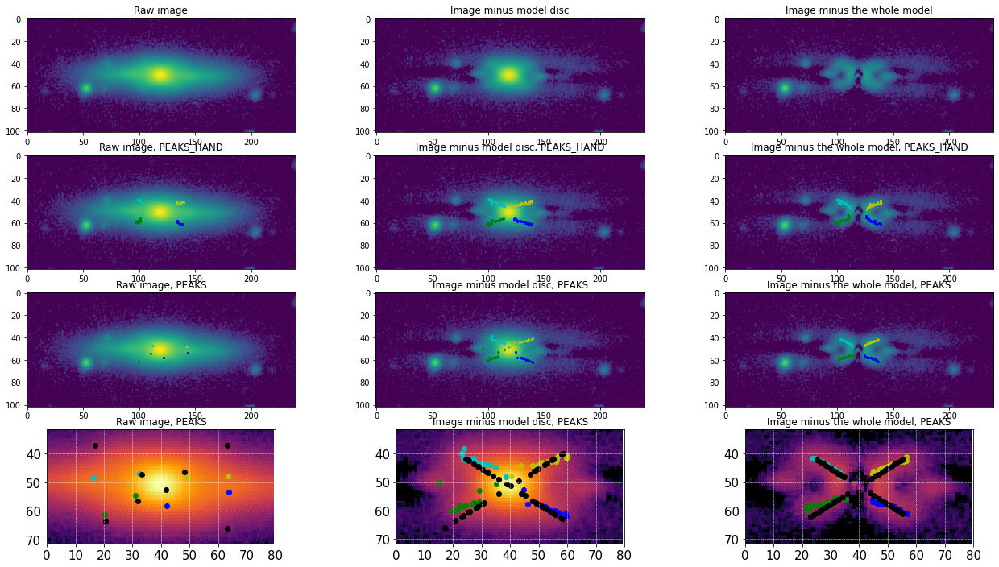

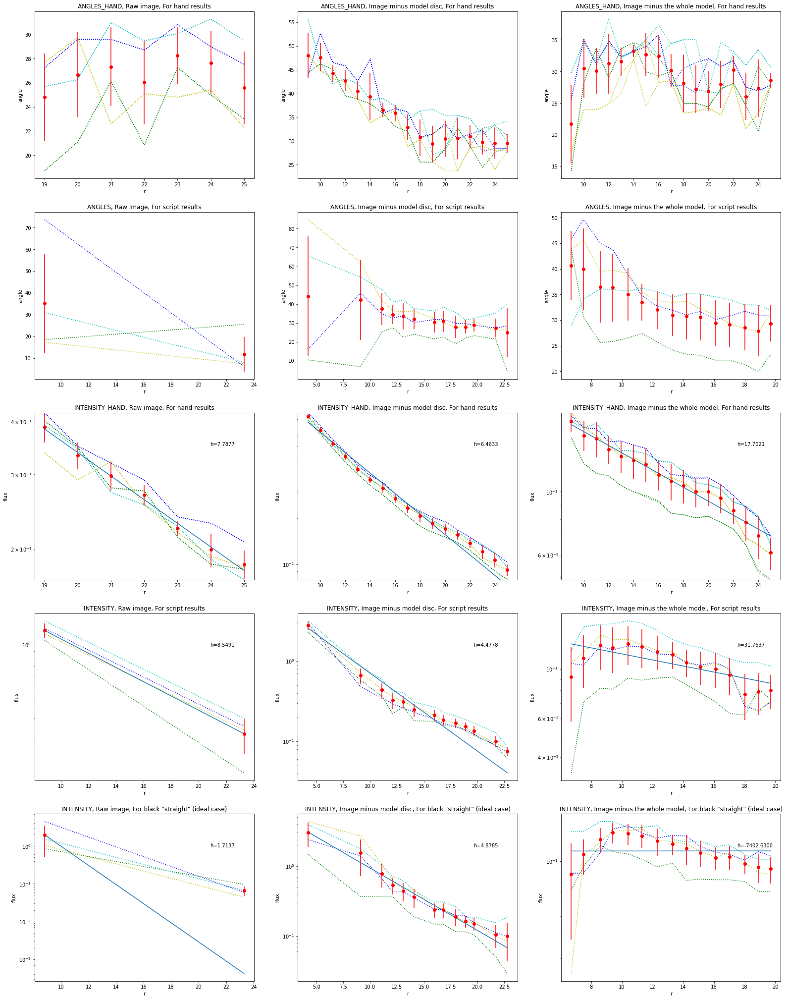

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
mb_804 , ellipticity = 0.400000


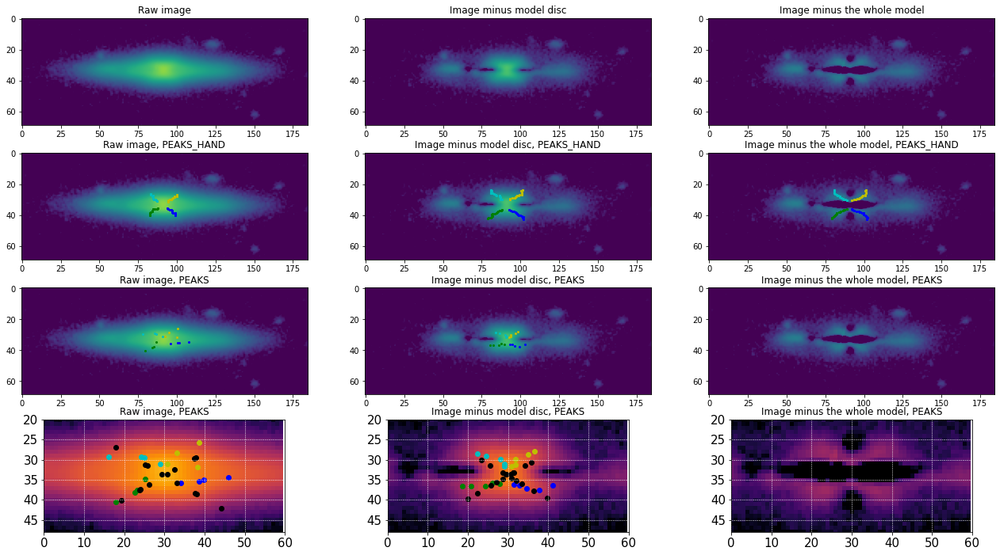

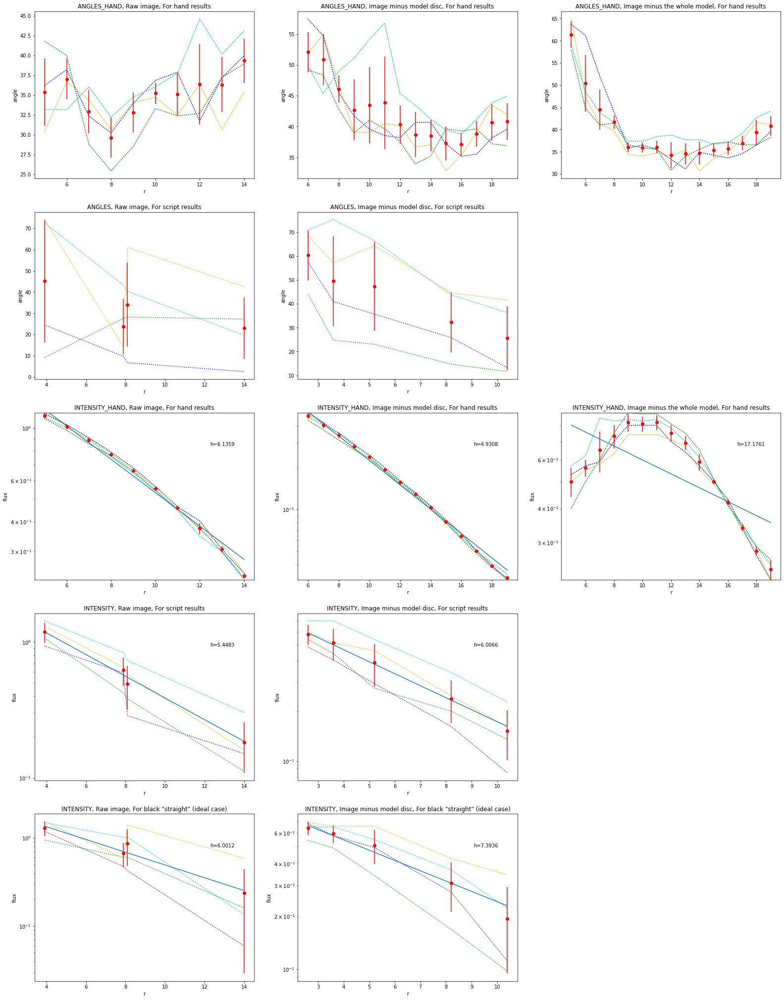

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
mb_1354 , ellipticity = 0.300000


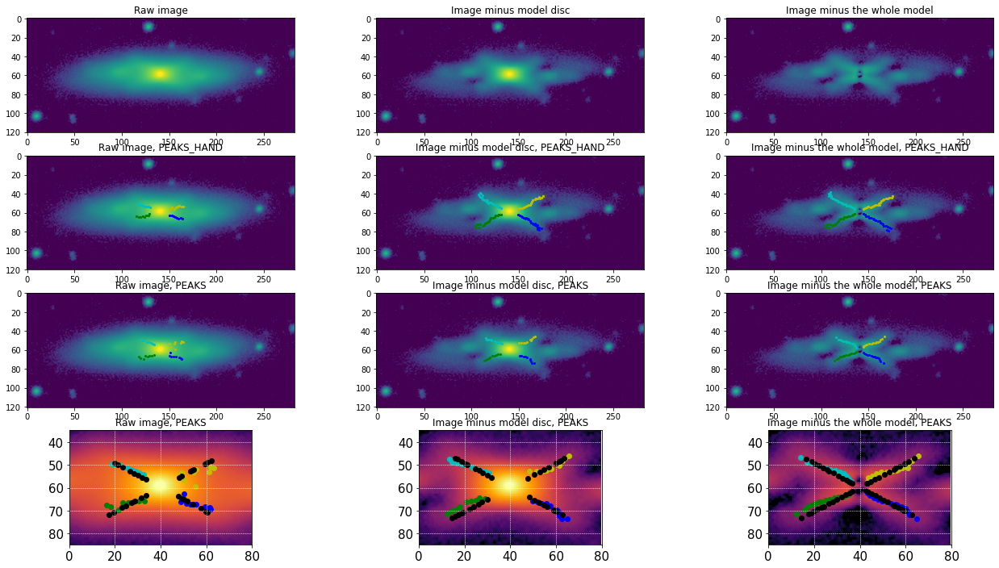

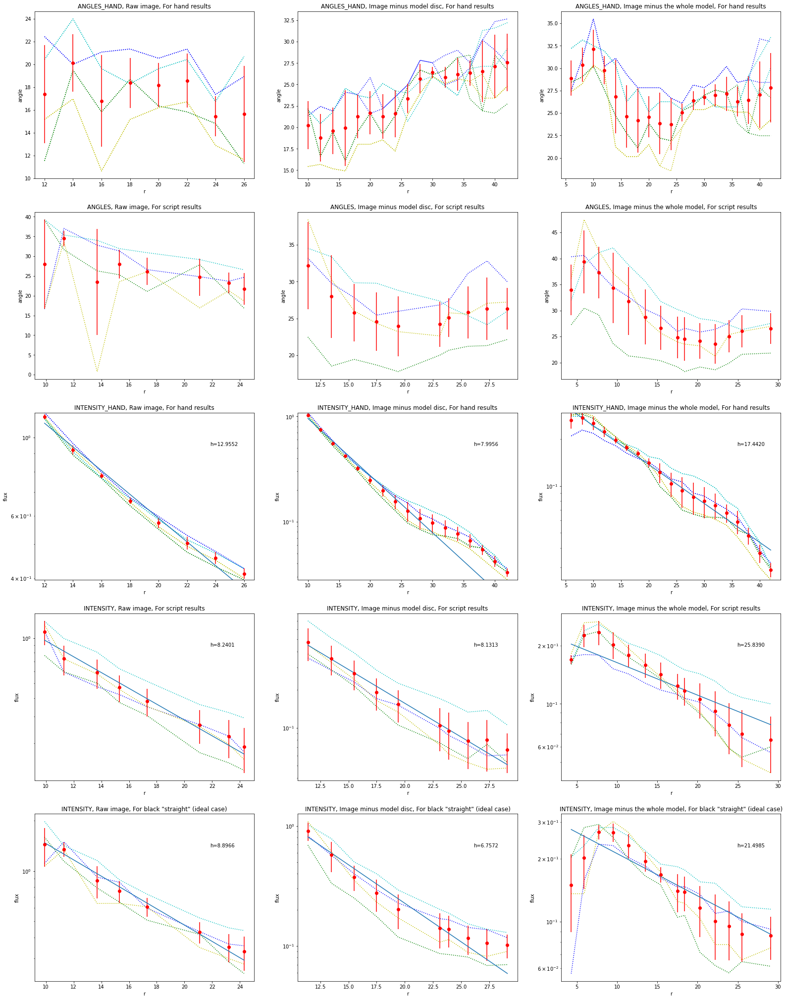

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
mb_1640 , ellipticity = 0.300000


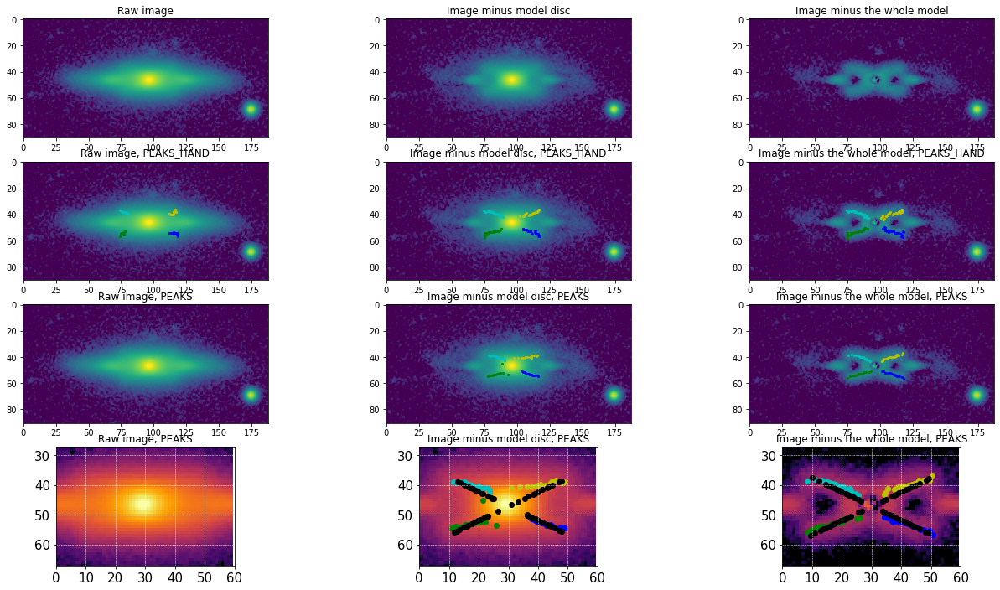

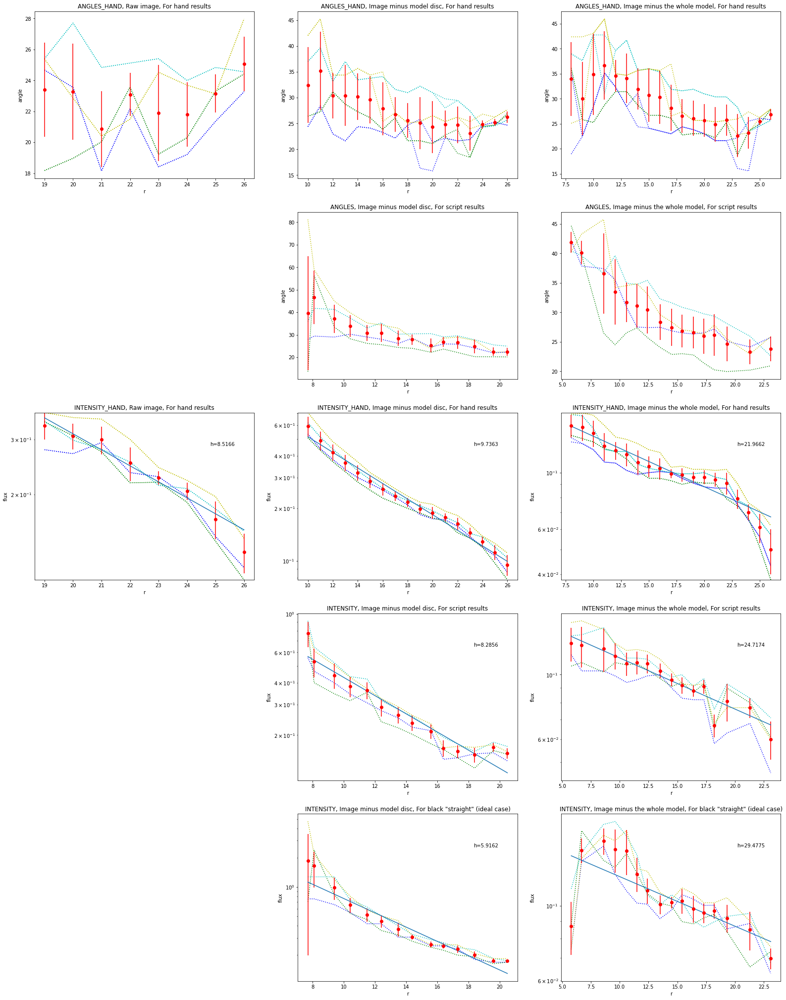

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
mb_eon183 , ellipticity = 0.700000


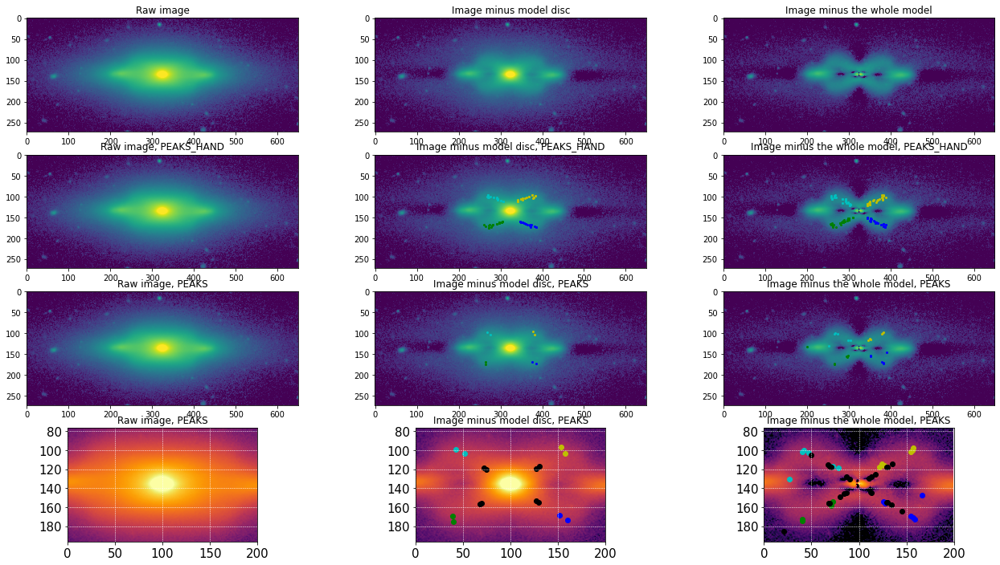

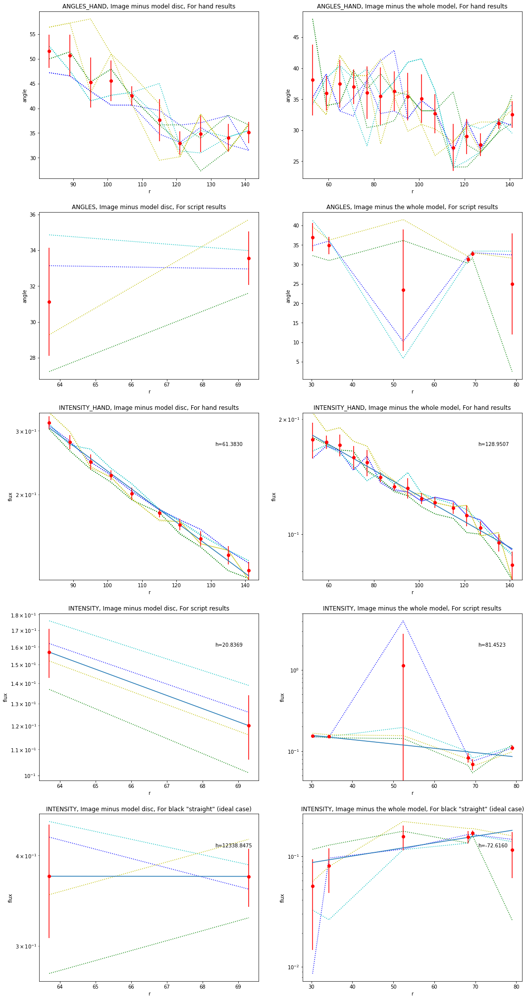

In [56]:
colors = ["b", "g", "c", "y"]
colors_hand = ["b", "b", "g", "g", "c", "c", "y", "y"]
my_cmap = copy.copy(matplotlib.cm.get_cmap('inferno'))  # copy the default cmap
my_cmap.set_bad((0, 0, 0))

for i in range(0,len(names)):
        
    name_gal = names[i][0]
    name_gal_ell = names[i][1]
    
    path_image, path_config, path_angles, path_intens, path_coords = [], [], [], [], []
    path_angles_hand, path_intens_hand, path_coords_hand = [], [], []
    data_image, data_intens = [], []
    radii, angles_1, intens_1, coords_1, angles_2, intens_2, coords_2 =  [], [], [], [], [], [], []
    radii_hand, angles_hand, intens_hand, coords_hand = [], [], [], []
    xcen, ycen, axis_ratio =  [], [], []
    ind_2 = [ [[],[],[],[]] , [[],[],[],[]], [[],[],[],[]] ]
    
    for i_a_d_m, a_d_m in [[0,'a'],[1,'d'],[2,'m']]:
        if i_a_d_m == 0:
            path_image0 = './images/image_{}.fits'.format(name_gal) 
            path_image.append(path_image0)
        else:
            path_image0 = './images/image_{}_{}.fits'.format(name_gal,a_d_m) 
            path_image.append(path_image0)           
        path_angles_hand0 = './result/{}_{}/angles_hand.dat'.format(name_gal_ell,a_d_m)
        path_intens_hand0 = './result/{}_{}/intensities_hand.dat'.format(name_gal_ell,a_d_m)
        path_coords_hand0 = './result/{}_{}/coord_xy_peaks_hand.dat'.format(name_gal_ell,a_d_m)        
        if names[i][2+i_a_d_m] == 'old':
            path_angles0 = './result/{}_{}/angles.dat'.format(name_gal_ell,a_d_m)
            path_intens0 = './result/{}_{}/intensities.dat'.format(name_gal_ell,a_d_m)
            path_coords0 = './result/{}_{}/coord_xy_peaks.dat'.format(name_gal_ell,a_d_m)
        if names[i][2+i_a_d_m] == 'new':
            path_angles0 = './result/{}_{}/angles_clean.dat'.format(name_gal_ell,a_d_m)
            path_intens0 = './result/{}_{}/intensities_clean.dat'.format(name_gal_ell,a_d_m)
            path_coords0 = './result/{}_{}/coord_xy_peaks_clean.dat'.format(name_gal_ell,a_d_m)
        path_angles_hand.append(path_angles_hand0)     
        path_intens_hand.append(path_intens_hand0)       
        path_coords_hand.append(path_coords_hand0)
        path_angles.append(path_angles0)     
        path_intens.append(path_intens0)       
        path_coords.append(path_coords0)      
        path_config0 = './configs/config_{}_{}.dat'.format(name_gal_ell,a_d_m)
        path_config.append(path_config0)
        path_raw_image = './images/image_{}.fits'.format(name_gal)
        
        hdulist_image  = fits.open(path_image[i_a_d_m])
        data_image0 = hdulist_image[0].data 
        data_image.append(data_image0)
        
    # Первый набор данных -- координаты, углы и интенсивности для точек, получаемые программой.
    # У каждой галактики эти данные записаны в файлах coord_xy_peaks.dat, angles.dat, intensities.dat.
    
        radii0 = np.loadtxt(path_angles[i_a_d_m], usecols=[0], comments='#') 
        radii.append(radii0)                                  
        angles_10 = np.loadtxt(path_angles[i_a_d_m], usecols=np.arange(1,7), comments='#')  
        angles_1.append(angles_10)
        intens_10 = np.loadtxt(path_intens[i_a_d_m], usecols=np.arange(1,7), comments='#') 
        intens_1.append(intens_10)
        coords_10 = np.loadtxt(path_coords[i_a_d_m], usecols=np.arange(1,9), comments='#') 
        coords_1.append(coords_10)
        
        try:
            radii_hand0 = np.loadtxt(path_angles_hand[i_a_d_m], usecols=[0], comments='#') 
            radii_hand.append(radii_hand0) 
            angles_hand0 = np.loadtxt(path_angles_hand[i_a_d_m], usecols=np.arange(1,11), comments='#')  
            angles_hand.append(angles_hand0)
            intens_hand0 = np.loadtxt(path_intens_hand[i_a_d_m], usecols=np.arange(1,11), comments='#') 
            intens_hand.append(intens_hand0)
            coords_hand0 = np.loadtxt(path_coords_hand[i_a_d_m], usecols=np.arange(1,17), comments='#') 
            coords_hand.append(coords_hand0) 
        except:
            radii_hand.append([]) 
            angles_hand.append([])
            intens_hand.append([])
            coords_hand.append([]) 
    
    # Второй набор тех же данных, но для чёрной "прямой", состоящей из чёрных точек. 
            
            # Найдём координаты центра изображения и эллиптичность эллипсов
        with open(path_config[i_a_d_m]) as file:
            for line in file:
                if line.find('x_center:') != -1:
                    xcen0 = float(line.split()[1])
                    xcen.append(xcen0)
                if line.find('y_center:') != -1:
                    ycen0 = float(line.split()[1])
                    ycen.append(ycen0)
                if line.find('ell_ellipticity:') != -1:
                    ell = float(line.split()[1])
        ell_l = []
        ell_l.append(ell)
        axis_ratio0 = np.ones(len(ell_l)) - ell_l 
        axis_ratio.append(axis_ratio0)
        signs_xy = ((1,1),(-1,1),(-1,-1),(1,-1),)
        x0 = names[i][5]
        y0 = ycen[i_a_d_m]   
        k_ideal = names[i][7] 
        ang = 1
        
        data_intens0 = data_image[i_a_d_m][:,int(xcen[i_a_d_m]-x0):int(xcen[i_a_d_m]+x0)]
        data_intens.append(data_intens0)
        
        if names[i][8+i_a_d_m] == 'y':
            angles_20 = np.zeros((radii[i_a_d_m].size,6))
            angles_2.append(angles_20)
            coords_20 = np.zeros((radii[i_a_d_m].size,8))
            coords_2.append(coords_20)
            intens_20 = np.zeros((radii[i_a_d_m].size,6))
            intens_2.append(intens_20)
            angles_2[i_a_d_m][:, 0:4] = np.tan(angles_1[i_a_d_m][:, 0:4]*np.pi/180)
            for j in range (1,5): 
                x = radii[i_a_d_m]/np.sqrt(1 + angles_2[i_a_d_m][:,j-1]**2/axis_ratio[i_a_d_m][0]**2)
                y = angles_2[i_a_d_m][:,j-1]*x
                x_ideal = np.copy(x)
                y_ideal = x_ideal*k_ideal
                x, y = rotate_via_numpy(x, y, np.pi/180.0*ang)
                x_ideal, y_ideal = rotate_via_numpy(x_ideal, y_ideal, np.pi/180.0*ang)
                x_ideal = x0 + signs_xy[j-1][0]*x_ideal
                y_ideal = y0 + signs_xy[j-1][1]*y_ideal  
                x = x0 + signs_xy[j-1][0]*x
                y = y0 + signs_xy[j-1][1]*y
                coords_2[i_a_d_m][:,j-1], coords_2[i_a_d_m][:,j+3] = np.transpose(x_ideal), np.transpose(y_ideal)
            for jj1 in range (1,5):
                for jj in range(len(x_ideal)):
                    intens_2[i_a_d_m][jj,jj1-1] = data_intens[i_a_d_m][int(coords_2[i_a_d_m][jj,jj1+3])][int(coords_2[i_a_d_m][jj,jj1-1])]
                    if intens_2[i_a_d_m][jj,jj1-1] < 0:
                        intens_2[i_a_d_m][jj,jj1-1] = None
                        ind_2[i_a_d_m][jj1-1].append(jj)
            angles_2[i_a_d_m][:,0:4] = np.arctan(k_ideal)*180/pi
            for jj in range(len(x_ideal)):
                for_intens = [intf for intf in intens_2[i_a_d_m][jj,0:4] if intf != None and intf > 0.0]
                for_angles = []
                for iii in range(0,4):
                    if intens_2[i_a_d_m][jj,iii] != None:
                        for_angles.append(angles_2[i_a_d_m][jj,iii])
                intens_2[i_a_d_m][jj,4] = np.average(for_intens) 
                intens_2[i_a_d_m][jj,5] = np.std(for_intens) 
                angles_2[i_a_d_m][jj,4] = np.average(for_angles) 
                angles_2[i_a_d_m][jj,5] = np.std(for_angles)
        else:
            coords_2.append([])
            intens_2.append([])
            angles_2.append([])
            
        
        # Построение рисунков ====================================================
        
    print('=*'*50)
    print("%s , ellipticity = %f" % (names[i][0], names[i][11]))
      # Рисунки -------------------------------------------------------------------------
    fig = plt.figure(figsize=[names[i][14],names[i][15]])
    flag_hand,flag_scr = [],[]
    i_image = [0,1,2,0,1,2,0,1,2,0,1,2]
    for i_sub in range(12):
        plt.subplot(4,3,i_sub+1)
        if i_sub < 9:
            plt.imshow(data_image[i_image[i_sub]],norm=SymLogNorm(linthresh=0.001,vmin=names[i][12], 
                                                                                              vmax=names[i][13]))
            if i_sub >= 3 and i_sub <= 5:
                try:
                    for lobe_number in range(0, 8):
                        xf = [xc for xc in coords_hand[i_image[i_sub]][:,lobe_number] if xc != -1.0]
                        yf = [xc for xc in coords_hand[i_image[i_sub]][:,lobe_number+8] if xc != -1.0]
                        plt.plot(xf, yf, color=colors_hand[lobe_number],  marker='o', linestyle="", markersize=2.0)
                    flag_hand.append(0)
                except:
                    flag_hand.append(1)
            if i_sub >= 6 and i_sub <= 8:
                try:
                    for lobe_number in range(0, 4):
                        xf = [xc for xc in coords_1[i_image[i_sub]][:,lobe_number] if xc != -1.0]
                        yf = [xc for xc in coords_1[i_image[i_sub]][:,lobe_number+4] if xc != -1.0]
                        plt.plot(xf, yf, color=colors[lobe_number],  marker='o', linestyle="", markersize=2.0)
                    flag_scr.append(0)
                except:
                    flag_scr.append(1)
        if i_sub >= 9 and i_sub <= 11:
            plt.imshow(data_image[i_image[i_sub]][:,int(xcen[i_image[i_sub]]-names[i][5]):int(xcen[i_image[i_sub]]+names[i][5])], 
                       cmap=my_cmap, origin="lower", norm=LogNorm(vmin=names[i][12], vmax=names[i][13]))
            plt.grid(color='w', linestyle='--', linewidth=0.5)
            plt.xticks(fontsize=15)
            plt.yticks(fontsize=15)
            try:
                for lobe_number in range(0, 4):
                    xx = [xc for xc in coords_1[i_image[i_sub]][:,lobe_number] if xc != -1.0]
                    yy = [xc for xc in coords_1[i_image[i_sub]][:,lobe_number+4] if xc != -1.0]
                    if names[i][8+i_image[i_sub]] == 'y':
                        x2 = [xc for xc in coords_2[i_image[i_sub]][:,lobe_number] if xc != -1.0]
                        y2 = [xc for xc in coords_2[i_image[i_sub]][:,lobe_number+4] if xc != -1.0]
                    # bbb = [x01+1 for x01 in aaa]
                    xx = [z+names[i][5]-xcen[i_image[i_sub]] for z in xx]
                    #xx = names[i][5] - xcen[i_image[i_sub]]  + xx
                    plt.scatter(xx, yy, color=colors[lobe_number])
                    if names[i][8+i_image[i_sub]] == 'y':
                        plt.scatter(x2, y2, color="k")
            except:
                pass
            plt.gca().set_aspect("equal")
            plt.xlim([-names[i][5]+names[i][5], names[i][5]+names[i][5]])
            plt.ylim([-names[i][6]+ycen[i_image[i_sub]], names[i][6]+ycen[i_image[i_sub]]])
            plt.gca().invert_yaxis()
        plt.title(titles_1[i_sub])
    plt.savefig("./result/picture_peaks_{}.png".format(name_gal_ell),dpi=300,bbox_inches = 'tight', 
                                                                                             pad_inches = 0.1)
    plt.show()
    
    # Графики -------------------------------------------------------------------------
    
    fig = plt.figure(figsize=[names[i][16],names[i][17]])
    ind = [0,1,2,0,1,2,0,1,2,0,1,2,0,1,2]
    for i_sub in range(15):
        if i_sub < 3:
            if flag_hand[ind[i_sub]] == 0:
                plt.subplot(5,3,i_sub+1)
                for lobe_number in range(0, 8):
                    plt.plot(radii_hand[ind[i_sub]], angles_hand[ind[i_sub]][:,lobe_number], 
                             color=colors_hand[lobe_number], linestyle=":")
                plt.errorbar(x=radii_hand[ind[i_sub]], y=angles_hand[ind[i_sub]][:,8], 
                                               yerr=angles_hand[ind[i_sub]][:,9], fmt="ro")
                plt.xlabel("r")
                plt.ylabel("angle")
                plt.title(titles_2[i_sub])
        if i_sub >= 3 and i_sub <= 5:
            if flag_scr[ind[i_sub]] == 0:
                plt.subplot(5, 3, i_sub+1)
                for lobe_number in range(0, 4):
                    radiif = []
                    anglesf = []
                    for ii in range(len(radii[ind[i_sub]])):
                        if angles_1[ind[i_sub]][ii,lobe_number] != -1:
                            radiif.append(radii[ind[i_sub]][ii])
                            anglesf.append(angles_1[ind[i_sub]][ii,lobe_number]) 
                    plt.plot(radiif, anglesf, color=colors[lobe_number], linestyle=":")
                plt.errorbar(x=radii[ind[i_sub]], y=angles_1[ind[i_sub]][:,4], yerr=angles_1[ind[i_sub]][:,5], 
                                                                                                     fmt="ro")
                plt.xlabel("r")
                plt.ylabel("angle")
                plt.title(titles_2[i_sub])
        if i_sub >= 6 and i_sub <= 8:
            if flag_hand[ind[i_sub]] == 0:
                plt.subplot(5, 3, i_sub+1)
                central_value, exp_scale = fit_by_explaw(radii_hand[ind[i_sub]], intens_hand[ind[i_sub]][:,8], 
                                                                                 intens_hand[ind[i_sub]][:,9])
                list_maxs, list_mins = [],[]
                for lobe_number in range(0, 8):
                    plt.plot(radii_hand[ind[i_sub]], intens_hand[ind[i_sub]][:,lobe_number],
                             color=colors_hand[lobe_number], linestyle=":")
                    list_maxs.append(max(intens_hand[ind[i_sub]][:,lobe_number]))
                    list_mins.append(min(intens_hand[ind[i_sub]][:,lobe_number]))
                plt.errorbar(x=radii_hand[ind[i_sub]], y=intens_hand[ind[i_sub]][:,8], 
                                                    yerr=intens_hand[ind[i_sub]][:,9], fmt="ro")
                plt.plot(radii_hand[ind[i_sub]], explaw([central_value, exp_scale], 
                                                                radii_hand[ind[i_sub]]), linestyle="solid")
                plt.annotate(text="h=%1.4f" % exp_scale, xy=(0.8, 0.8), xycoords="axes fraction")
                plt.xlabel("r")
                plt.ylabel("flux")
                plt.yscale('log')
                plt.ylim([min(list_mins),max(list_maxs)])
                plt.title(titles_2[i_sub])
        if i_sub >= 9 and i_sub <= 11:
            if flag_scr[ind[i_sub]] == 0:
                plt.subplot(5, 3, i_sub+1)
                central_value, exp_scale = fit_by_explaw(radii[ind[i_sub]], intens_1[ind[i_sub]][:,4], 
                                                                            intens_1[ind[i_sub]][:,5])
                for lobe_number in range(0, 4):
                    radiif = []
                    intensf = []
                    for ii in range(len(radii[ind[i_sub]])):
                        if intens_1[ind[i_sub]][ii,lobe_number] != -1 and intens_1[ind[i_sub]][ii,lobe_number] > 0.0:
                            radiif.append(radii[ind[i_sub]][ii])
                            intensf.append(intens_1[ind[i_sub]][ii,lobe_number])                      
                    plt.plot(radiif, intensf, color=colors[lobe_number], linestyle=":")
                plt.errorbar(x=radii[ind[i_sub]], y=intens_1[ind[i_sub]][:,4], yerr=intens_1[ind[i_sub]][:,5], 
                                                                                                    fmt="ro")
                plt.plot(radii[ind[i_sub]],explaw([central_value,exp_scale],radii[ind[i_sub]]),linestyle="solid")
                plt.annotate(text="h=%1.4f" % exp_scale, xy=(0.8, 0.8), xycoords="axes fraction")
                plt.xlabel("r")
                plt.ylabel("flux")
                plt.yscale('log')
                plt.title(titles_2[i_sub])
        if i_sub >= 12 and i_sub <= 14:
            if flag_scr[ind[i_sub]] == 0 and names[i][8+ind[i_sub]] == 'y':
                plt.subplot(5, 3, i_sub+1)
                central_value, exp_scale = fit_by_explaw(radii[ind[i_sub]], intens_2[ind[i_sub]][:,4], 
                                                                            intens_2[ind[i_sub]][:,5])
                for lobe_number in range(0, 4):
                    radiif = []
                    intensf = []
                    for ii in range(len(radii[ind[i_sub]])):
                        if intens_2[ind[i_sub]][ii,lobe_number] != -1 and intens_1[ind[i_sub]][ii,lobe_number] > 0.0:
                            radiif.append(radii[ind[i_sub]][ii])
                            intensf.append(intens_2[ind[i_sub]][ii,lobe_number])                      
                    plt.plot(radiif, intensf, color=colors[lobe_number], linestyle=":")
                plt.errorbar(x=radii[ind[i_sub]], y=intens_2[ind[i_sub]][:,4], yerr=intens_2[ind[i_sub]][:,5], 
                                                                                                    fmt="ro")
                plt.plot(radii[ind[i_sub]],explaw([central_value,exp_scale],radii[ind[i_sub]]),linestyle="solid")
                plt.annotate(text="h=%1.4f" % exp_scale, xy=(0.8, 0.8), xycoords="axes fraction")
                plt.xlabel("r")
                plt.ylabel("flux")
                plt.yscale('log')
                plt.title(titles_2[i_sub])
    plt.savefig("./result/graphs_{}.png".format(name_gal_ell),dpi=300,bbox_inches = 'tight', pad_inches = 0.1)
    plt.show()
                   